# Sampling Hyperparameters

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import pymc3 as pm
import g3py as g3
g3.style_seaborn()

x, y = g3.load_sunspots()
obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, 0.30)

::

    Number of Observations - 309 (Annual 1700 - 2008)
    Number of Variables - 1
    Variable name definitions::

        SUNACTIVITY - Number of sunspots for each year

    The data file contains a 'YEAR' variable that is not returned by load.

Total: 309 | Obs: 92 (29.77346278317152%)


In [2]:
tgp = g3.GaussianProcess(1, g3.Bias(), g3.SE(x_obs)+g3.COS(x_obs), noise=True,
                        recompile=True, file='models/04-GP.g3')

Space Dimension:  1
Init Definition
Definition OK
Compilation OK
Saved model models/04-GP.g3


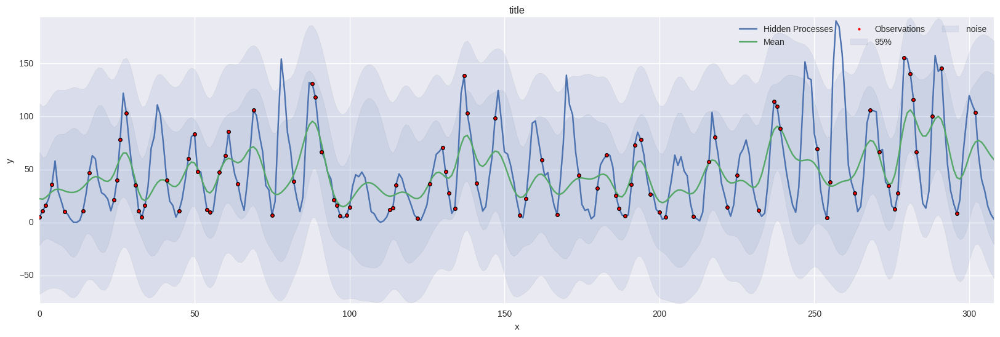

In [3]:
tgp.observed(x_obs, y_obs)
tgp.set_space(x, y)
tgp.plot()

In [4]:
params = tgp.find_MAP()

Starting function value (-logp): 473.148641502

start_bfgs
         Current function value: 442.304721
         Iterations: 39
         Function evaluations: 176
         Gradient evaluations: 169

start_powell
Optimization terminated successfully.
         Current function value: 432.092145
         Iterations: 4
         Function evaluations: 453


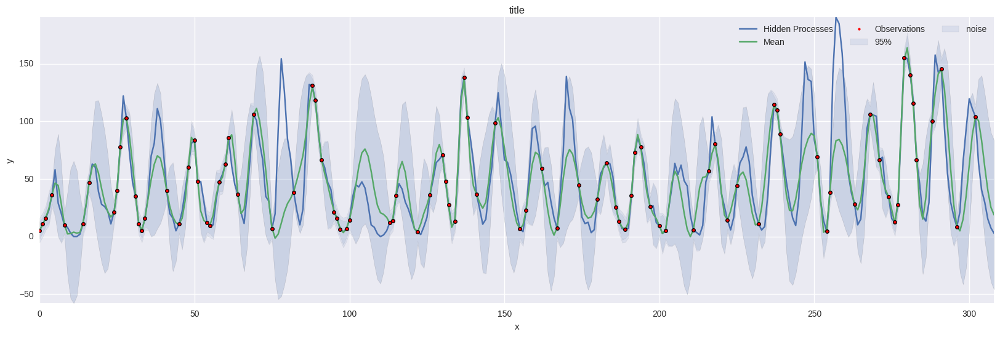

In [5]:
tgp.plot(params)

In [6]:
trace_default = tgp.sample_hypers(start=tgp.get_params_default(), 
                                  samples=5000, method='Slice')

100%|██████████| 5000/5000 [03:14<00:00, 25.75it/s]


In [7]:
trace_findmap = tgp.sample_hypers(start=params, 
                                  samples=5000, method='Slice')

100%|██████████| 5000/5000 [02:32<00:00, 32.82it/s]


In [8]:
trace_random = tgp.sample_hypers(start=tgp.get_params_random(), 
                                  samples=5000, method='Slice')

100%|██████████| 5000/5000 [02:47<00:00, 29.92it/s]


In [9]:
trace_rfmap = tgp.sample_hypers(start=tgp.get_params_random(params), 
                                  samples=5000, method='Slice')

100%|██████████| 5000/5000 [03:09<00:00, 27.82it/s]


In [10]:
traces = g3.append_traces([trace_default, trace_findmap, 
                           trace_random, trace_rfmap])
datatraces = g3.trace_to_datatrace(tgp, traces)
g3.cluster_datatrace(datatraces)
g3.save_traces(tgp, traces, 'traces/04-samplings-traces/')
g3.save_datatrace(datatraces, 'datatraces/04-samplings-datatraces.pkl')

,count,mean,std,min,25%,50%,75%,max
GP_SE_var,20000.0,1447.269775,5.653958e+02,4.510706e+02,1063.494049,1293.732605,1634.343506,5.806348e+03
GP_SE_rate__0,20000.0,0.561051,1.295920e-01,2.922695e-01,0.518457,0.601046,0.646733,9.348818e-01
GP_COS_freq__0,20000.0,44.424408,1.712309e+02,6.120010e-07,0.003311,0.449594,5.909878,1.405900e+04
GP_COS_var,20000.0,200157.375000,1.528769e+07,3.090073e-01,255.640938,1081.190186,1600.761719,2.117115e+09
GP_Noise_var_log_,20000.0,1.860143,2.640030e+00,-2.771552e+00,-0.314219,2.266689,4.062969,6.651744e+00
GP_SE_rate_log___0,20000.0,-0.611450,2.746060e-01,-1.230079e+00,-0.656897,-0.509083,-0.435822,-6.733516e-02
GP_SE_var_log_,20000.0,7.215966,3.363399e-01,6.111624e+00,6.969315,7.165287,7.398996,8.666707e+00
GP_Noise_var,20000.0,52.911350,9.052787e+01,6.256485e-02,0.730359,9.647408,58.146685,7.741332e+02
GP_COS_var_log_,20000.0,6.461526,2.304865e+00,-1.174390e+00,5.543774,6.985818,7.378235,2.147332e+01
GP_COS_freq_log___0,20000.0,-2.442980,6.402702e+00,-1.430653e+01,-5.710427,-2.248242,1.776625,9.551018e+00


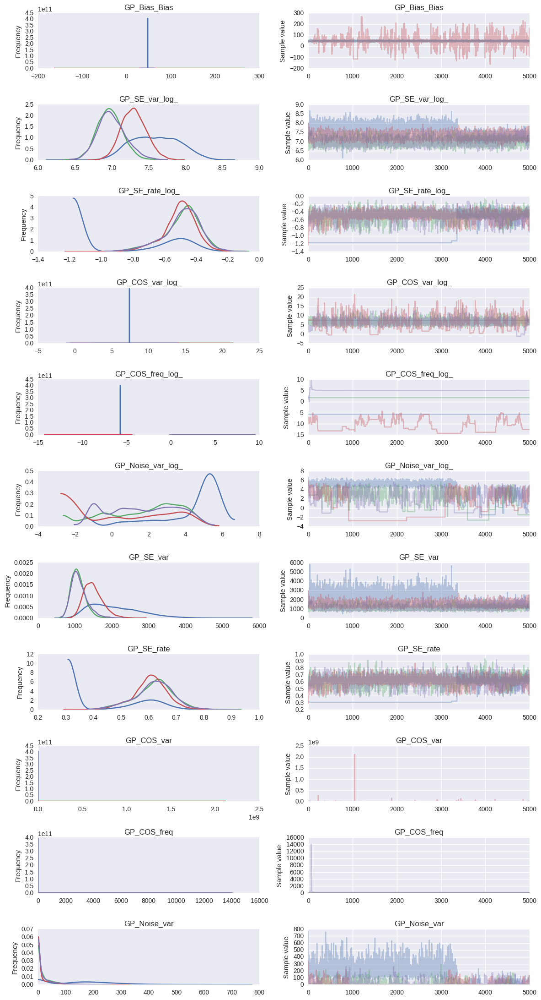

In [12]:
_ = g3.traceplot(traces, plot_transformed=True)

In [114]:
datatraces.describe().T

,count,mean,std,min,25%,50%,75%,max
GP_SE_var,20000.0,1447.269775,5.653958e+02,4.510706e+02,1063.494049,1293.732605,1634.343506,5.806348e+03
GP_SE_rate__0,20000.0,0.561051,1.295920e-01,2.922695e-01,0.518457,0.601046,0.646733,9.348818e-01
GP_COS_freq__0,20000.0,44.424408,1.712309e+02,6.120010e-07,0.003311,0.449594,5.909878,1.405900e+04
GP_COS_var,20000.0,200157.375000,1.528769e+07,3.090073e-01,255.640938,1081.190186,1600.761719,2.117115e+09
GP_Noise_var_log_,20000.0,1.860143,2.640030e+00,-2.771552e+00,-0.314219,2.266689,4.062969,6.651744e+00
GP_SE_rate_log___0,20000.0,-0.611450,2.746060e-01,-1.230079e+00,-0.656897,-0.509083,-0.435822,-6.733516e-02
GP_SE_var_log_,20000.0,7.215966,3.363399e-01,6.111624e+00,6.969315,7.165287,7.398996,8.666707e+00
GP_Noise_var,20000.0,52.911350,9.052787e+01,6.256485e-02,0.730359,9.647408,58.146685,7.741332e+02
GP_COS_var_log_,20000.0,6.461526,2.304865e+00,-1.174390e+00,5.543774,6.985818,7.378235,2.147332e+01
GP_COS_freq_log___0,20000.0,-2.442980,6.402702e+00,-1.430653e+01,-5.710427,-2.248242,1.776625,9.551018e+00


In [115]:
burnin = g3.conditional(datatraces, lambda df: df['_niter']>3500)
burnin.describe().T

#5996 (29.98 %)


,count,mean,std,min,25%,50%,75%,max
GP_SE_var,5996.0,1306.603638,3.094166e+02,5.768304e+02,1070.129944,1273.750122,1508.281281,2.788855e+03
GP_SE_rate__0,5996.0,0.612322,6.818449e-02,3.862790e-01,0.571393,0.616292,0.655369,9.348818e-01
GP_COS_freq__0,5996.0,41.041599,6.773365e+01,9.499373e-07,0.003311,2.957269,43.451424,1.683566e+02
GP_COS_var,5996.0,66277.359375,1.868842e+06,3.090073e-01,263.411354,1090.463989,1600.761719,9.276262e+07
GP_Noise_var_log_,5996.0,1.131927,2.200627e+00,-2.632897e+00,-0.786371,1.213352,3.162817,5.435884e+00
GP_SE_rate_log___0,5996.0,-0.496878,1.140308e-01,-9.511955e-01,-0.559677,-0.484035,-0.422557,-6.733516e-02
GP_SE_var_log_,5996.0,7.147624,2.350196e-01,6.357548e+00,6.975535,7.149721,7.318726,7.933386e+00
GP_Noise_var,5996.0,16.915977,2.684848e+01,7.186996e-02,0.455495,3.364795,23.637098,2.294956e+02
GP_COS_var_log_,5996.0,6.385631,2.504731e+00,-1.174390e+00,5.573717,6.994354,7.378235,1.834555e+01
GP_COS_freq_log___0,5996.0,-2.434755,6.381379e+00,-1.386687e+01,-5.710427,-1.619465,2.595100,5.126084e+00


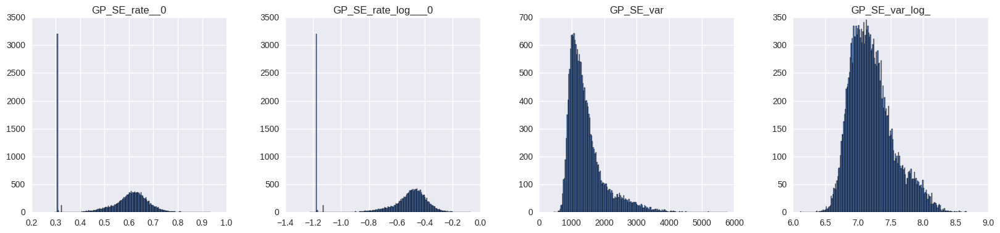

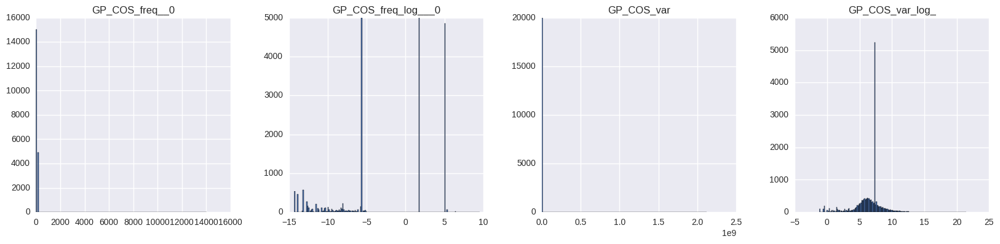

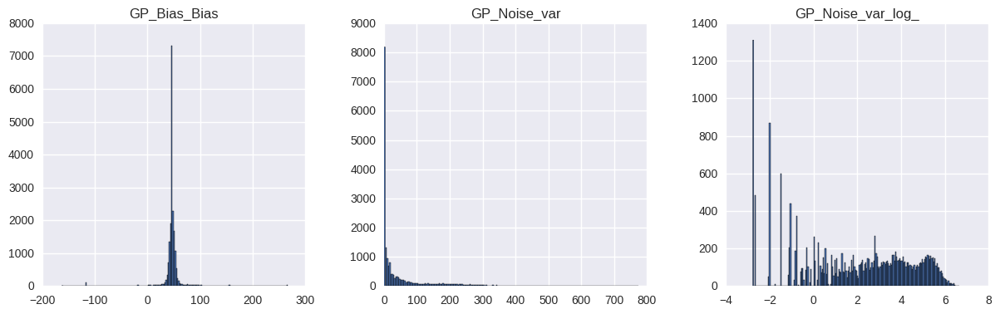

In [117]:
g3.hist_trace(datatraces, like="SE", bins=200, layout=(4,4))
g3.hist_trace(datatraces, like="COS", bins=200, layout=(4,4))
g3.hist_trace(datatraces, items=['GP_Noise_var','GP_Noise_var_log_','GP_Bias_Bias'], bins=200, layout=(4,4))

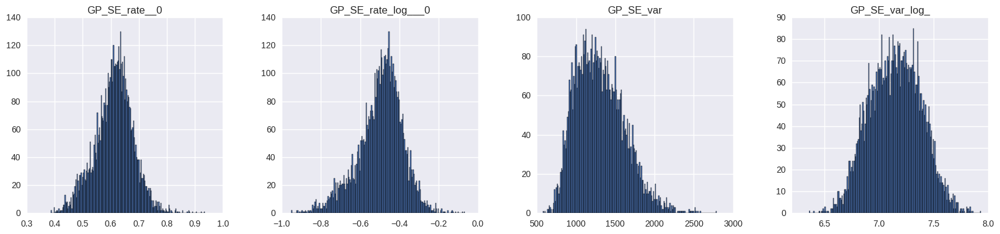

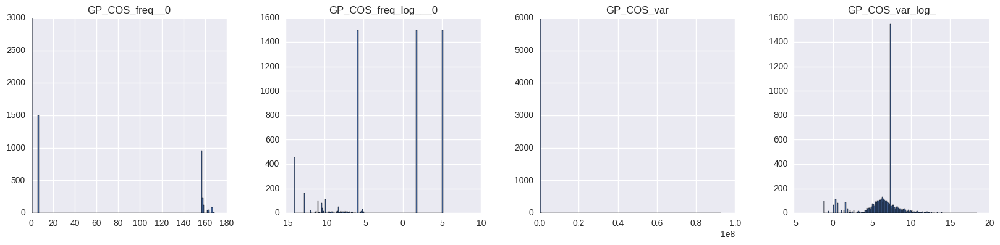

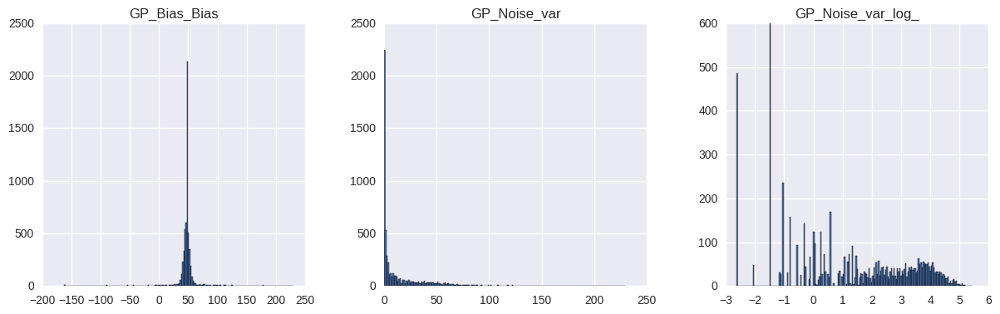

In [118]:
g3.hist_trace(burnin, like="SE", bins=200, layout=(4,4))
g3.hist_trace(burnin, like="COS", bins=200, layout=(4,4))
g3.hist_trace(burnin, items=['GP_Noise_var','GP_Noise_var_log_','GP_Bias_Bias'], bins=200, layout=(4,4))

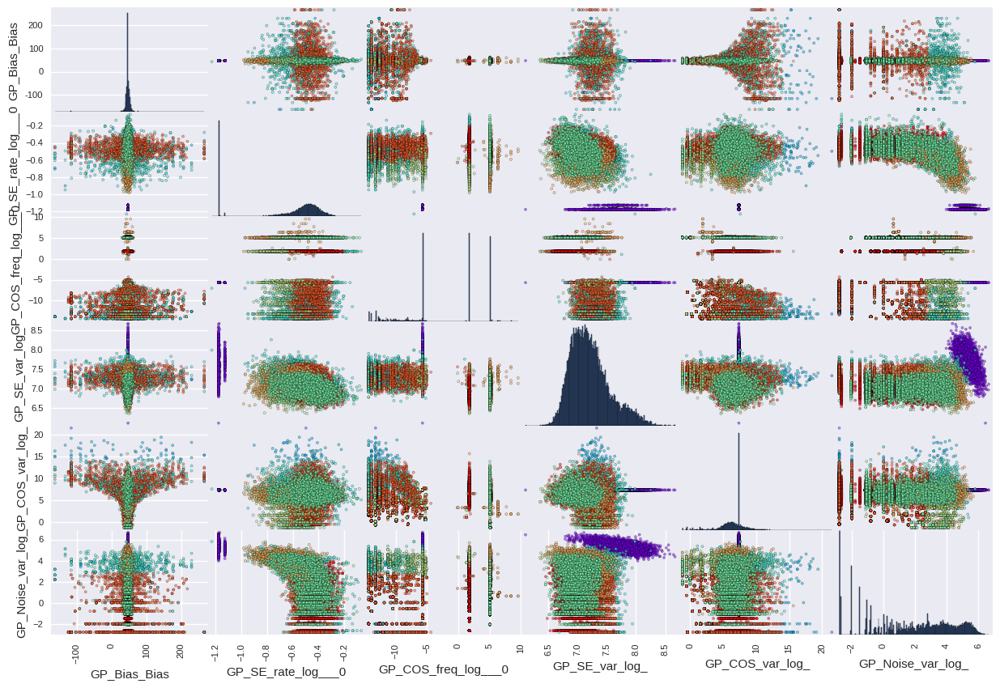

In [119]:
items_ll = ['_niter','_ll']
items_funs = ['GP_Bias_Bias','GP_SE_rate_log___0', 'GP_COS_freq_log___0']
items_vars = ['GP_SE_var_log_','GP_COS_var_log_','GP_Noise_var_log_']


g3.scatter_datatrace(datatraces,items_funs+items_vars, cluster=datatraces['_cluster'])

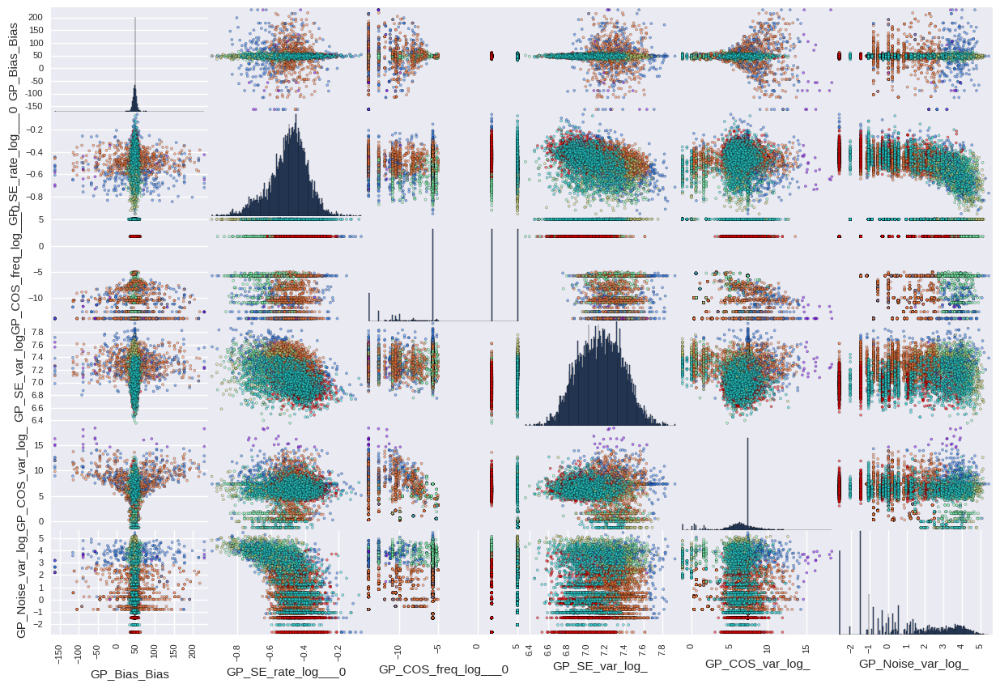

In [120]:
g3.scatter_datatrace(burnin,items_funs+items_vars, cluster=datatraces['_cluster'])

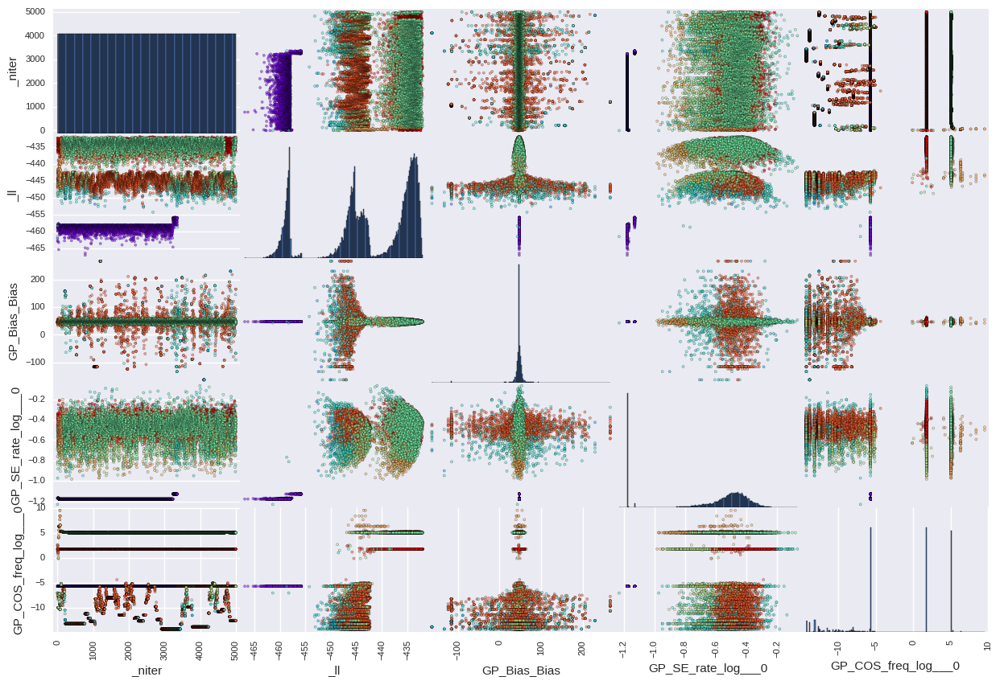

In [121]:
g3.scatter_datatrace(datatraces,items_ll+items_funs, cluster=datatraces['_cluster'])

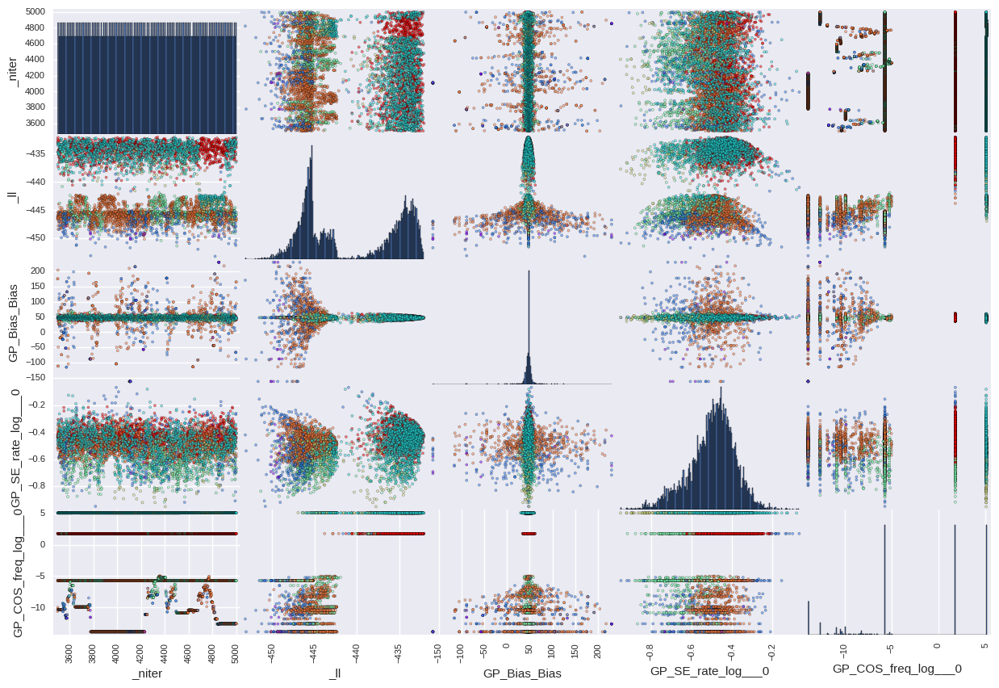

In [124]:
g3.scatter_datatrace(burnin,items_ll+items_funs, cluster=datatraces['_cluster'])

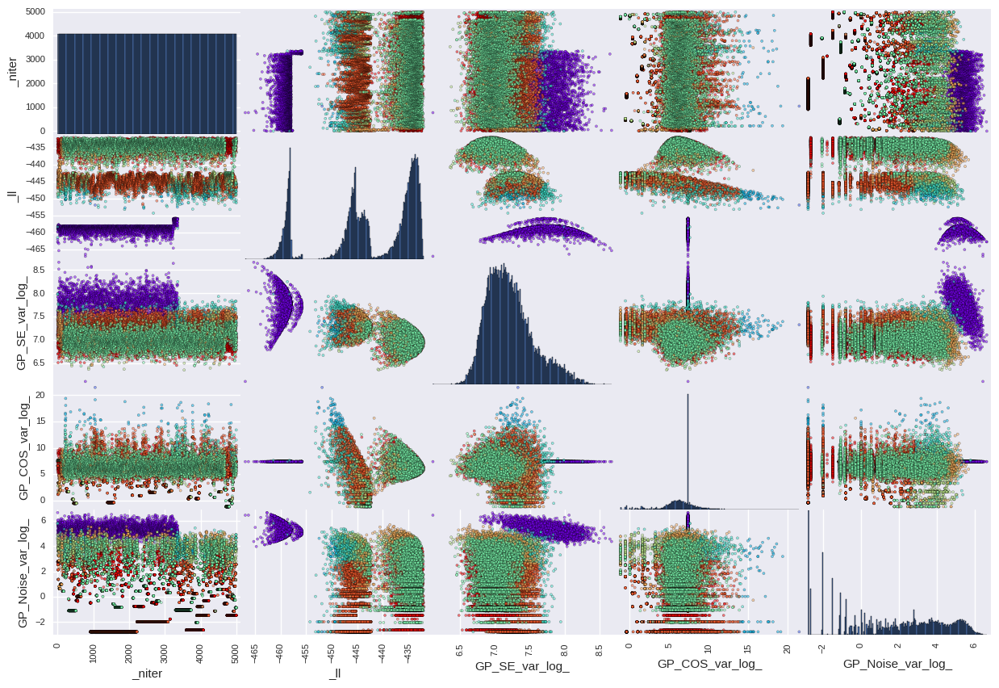

In [122]:
g3.scatter_datatrace(datatraces,items_ll+items_vars, cluster=datatraces['_cluster'])

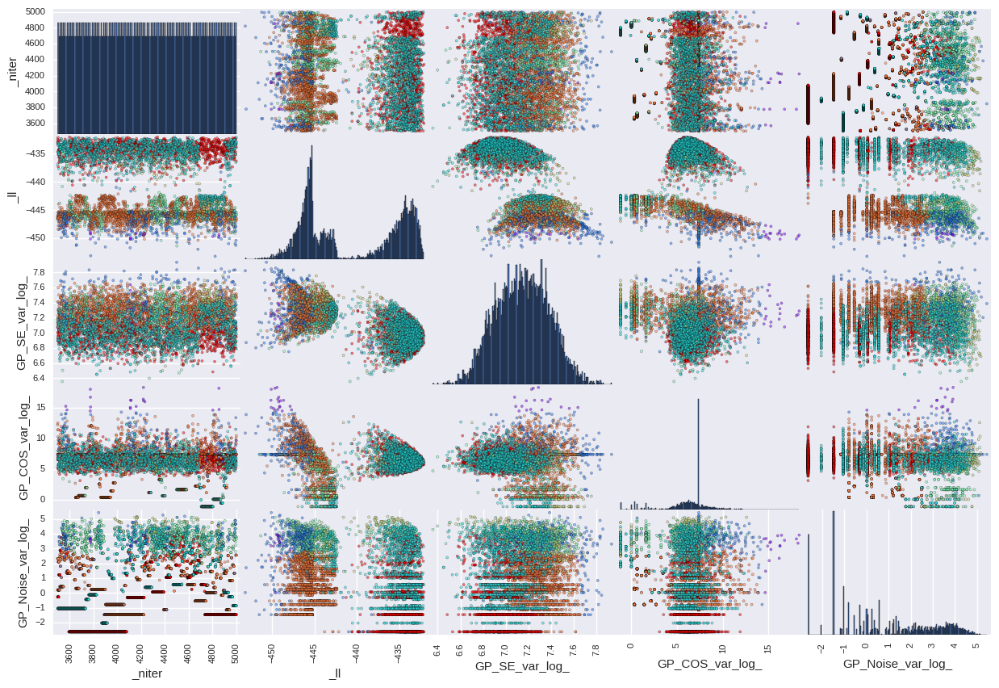

In [125]:
g3.scatter_datatrace(burnin,items_ll+items_vars, cluster=datatraces['_cluster'])

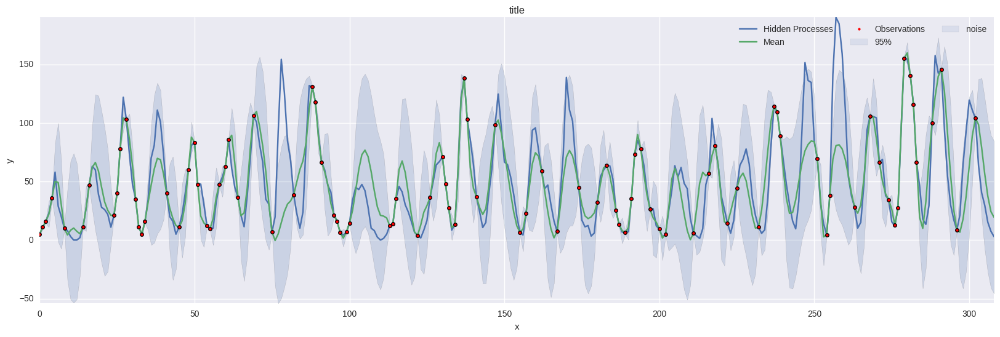

In [129]:
tgp.widget_traces(traces, 0)

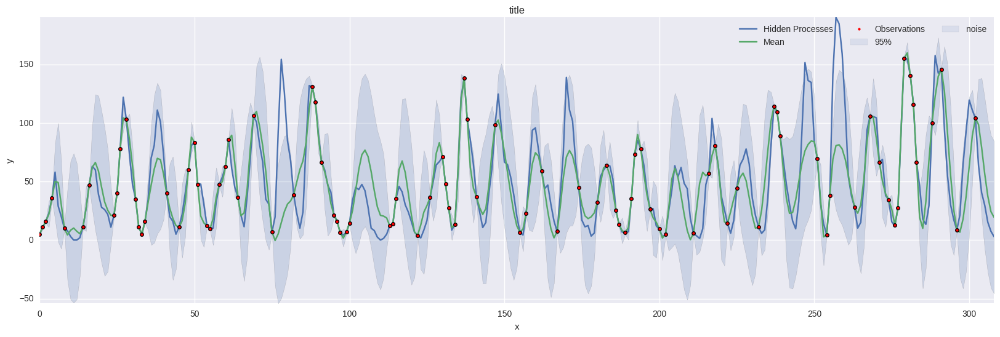

In [130]:
tgp.widget_traces(traces, 1)

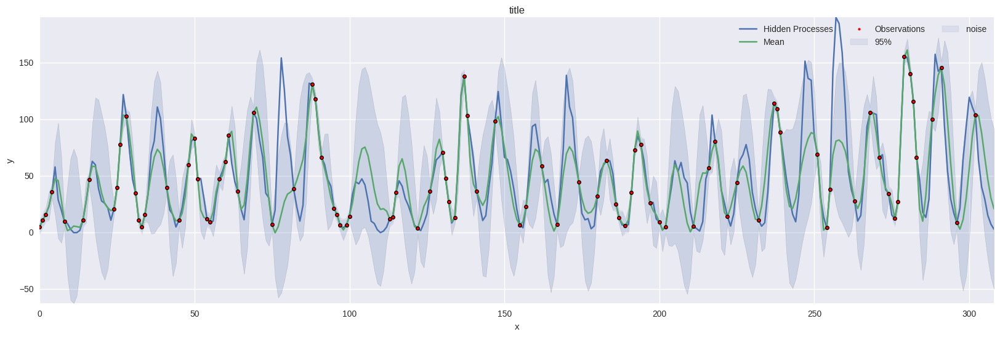

In [131]:
tgp.widget_traces(traces, 2)

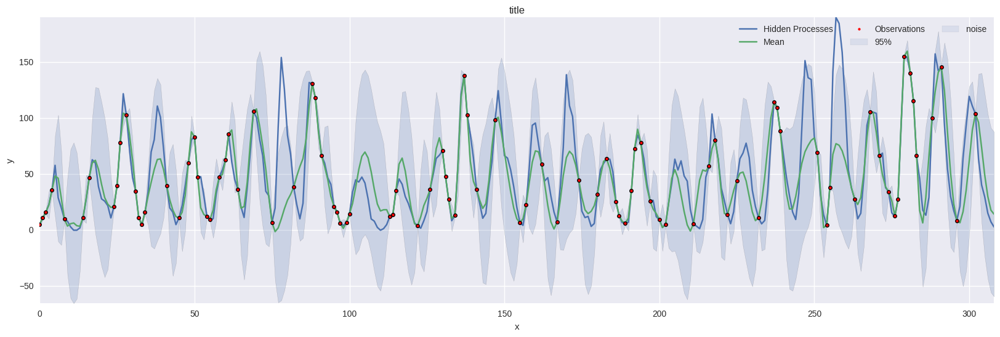

In [132]:
tgp.widget_traces(traces, 3)

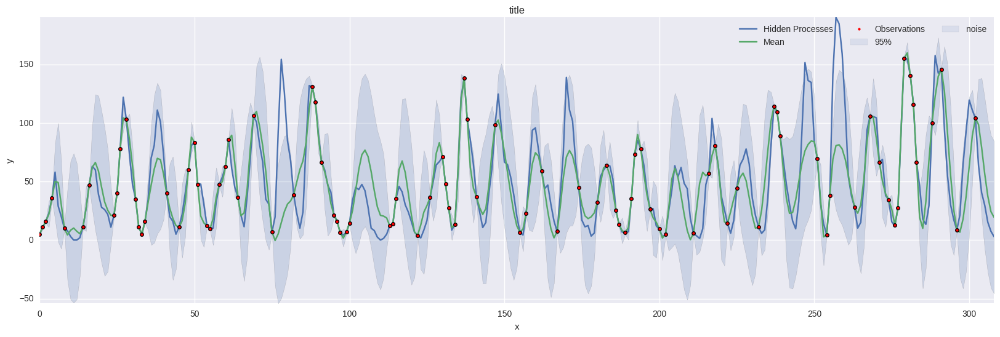

{'_BiasL1': 13.422718995675016,
 '_BiasL2': 555.31369886506991,
 '_NLL': 16.217576863718456,
 '_NLPD': 3.4801243374932134}

In [139]:
tgp.plot(tgp.get_params_widget())
tgp.scores(tgp.get_params_widget())

In [167]:
g3.find_candidates(datatraces)[0:1]

,GP_SE_var,GP_SE_rate__0,GP_COS_freq__0,GP_COS_var,GP_Noise_var_log_,GP_SE_rate_log___0,GP_SE_var_log_,GP_Noise_var,GP_COS_var_log_,GP_COS_freq_log___0,GP_Bias_Bias,_niter,_ll,_adll,_cluster
ll[7302],1018.970886,0.652182,5.90901,545.582825,-0.786124,-0.427431,6.926548,0.455607,6.301855,1.776478,47.447578,2302.0,-431.948188,1.42107,9.0


In [161]:
selected = {k:v for k,v in traces._straces[1][2302].items() if k in tgp.get_params_default().keys()}

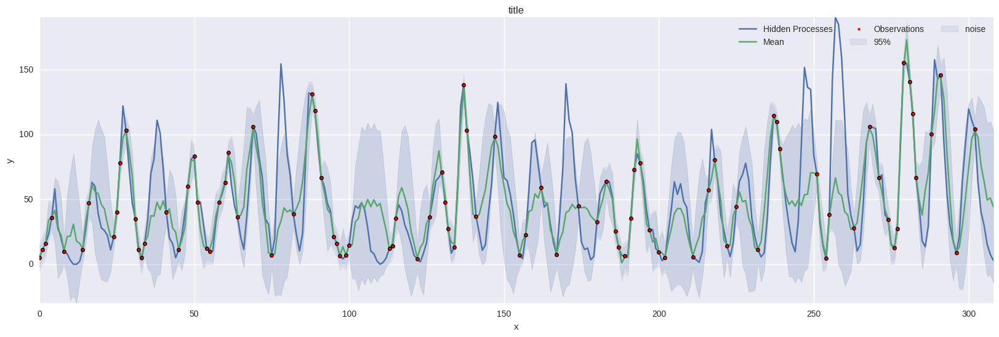

{'_BiasL1': 16.521128533012043,
 '_BiasL2': 732.60111151982835,
 '_NLL': 1290.8825523226224,
 '_NLPD': 4.2486013335705097}

In [140]:
tgp.plot(params)
tgp.scores(params)

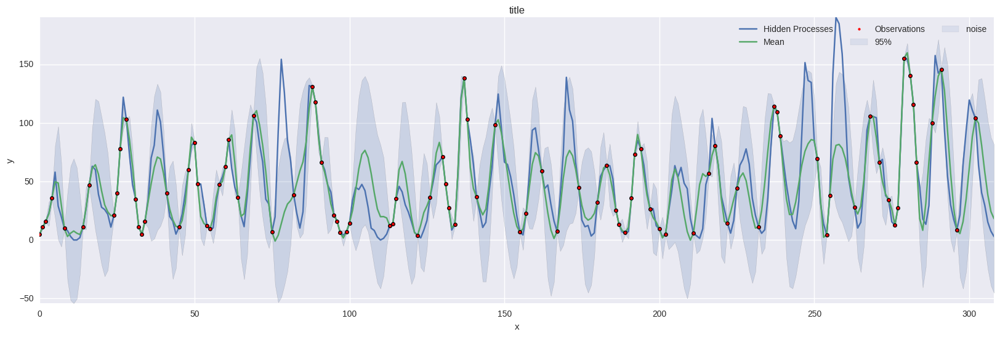

{'_BiasL1': 13.342845262393665,
 '_BiasL2': 555.00580647880543,
 '_NLL': 22.863716797103987,
 '_NLPD': 3.506167229408677}

In [165]:
tgp.plot(selected)
tgp.scores(selected)

In [168]:
tgp.get_params_widget()

{'GP_Bias_Bias': array(48.18992614746094, dtype=float32),
 'GP_COS_freq_log_': array([ 5.06833124], dtype=float32),
 'GP_COS_var_log_': array(6.0307159423828125, dtype=float32),
 'GP_Noise_var_log_': array(-0.865931510925293, dtype=float32),
 'GP_SE_rate_log_': array([-0.41008633], dtype=float32),
 'GP_SE_var_log_': array(6.982113838195801, dtype=float32)}

In [162]:
selected

{'GP_Bias_Bias': 47.447578,
 'GP_COS_freq_log_': array([ 1.77647829], dtype=float32),
 'GP_COS_var_log_': 6.3018546,
 'GP_Noise_var_log_': -0.78612417,
 'GP_SE_rate_log_': array([-0.4274312], dtype=float32),
 'GP_SE_var_log_': 6.9265485}

In [151]:
params

{'GP_Bias_Bias': 47.022625,
 'GP_COS_freq_log_': array([ 1.50771904], dtype=float32),
 'GP_COS_var_log_': 6.5714793,
 'GP_Noise_var_log_': 2.8602314,
 'GP_SE_rate_log_': array([-0.59352922], dtype=float32),
 'GP_SE_var_log_': 6.7980971}